In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import pearsonr
import seaborn as sns
import HERGAST
import torch
import torch.nn as nn
import torch.optim as optim
import anndata as ad
from tqdm import tqdm
import time
from scipy.stats import rankdata
import random
import STAGATE_pyG
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True 
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

plt.rcParams["figure.figsize"] = (9, 8)

# helper functions
def plot_gene_dist(adata,i,layer=None,num_bin=30,save=None):

    if layer is not None:
        df = pd.DataFrame({'value':adata.layers[layer][:,i],'mark':adata.obs['mark_area'].to_list()})
    else:
        df = pd.DataFrame({'value':adata.X[:,i],'mark':adata.obs['mark_area'].to_list()})
    
    sns.set_theme(style="white")
    palette = {
    '0': '#6384BA',
    '1': '#E39C73'
    }

    plt.figure(figsize=(9, 6))
    sns.histplot(data=df, x='value', hue='mark', bins=num_bin, alpha=0.5, element='step',common_norm=False, stat='density',palette=palette)
    
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(True)
    plt.gca().spines['bottom'].set_visible(True)
    plt.legend().set_visible(False)
    plt.xlabel('')
    plt.ylabel('')

    if save is not None:
        plt.savefig(save)
    else:
        plt.show()

def min_max_norm(data):
    # Min-Max 
    min_vals = data.min(axis=0)  
    max_vals = data.max(axis=0)  
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

def compute_all_metrics(Y_true, Y_pred):
    if hasattr(Y_true, "toarray"): Y_true = Y_true.toarray()
    if hasattr(Y_pred, "toarray"): Y_pred = Y_pred.toarray()
    def vectorized_pcc(X, Y):
        X_centered = X - X.mean(axis=0)
        Y_centered = Y - Y.mean(axis=0)
        numerator = np.sum(X_centered * Y_centered, axis=0)
        denominator = np.sqrt(np.sum(X_centered**2, axis=0)) * np.sqrt(np.sum(Y_centered**2, axis=0))
        return numerator / (denominator + 1e-12) #
    
    pcc_per_gene = vectorized_pcc(Y_true, Y_pred)
    
    Y_true_ranked = np.apply_along_axis(rankdata, 0, Y_true)
    Y_pred_ranked = np.apply_along_axis(rankdata, 0, Y_pred)
    spcc_per_gene = vectorized_pcc(Y_true_ranked, Y_pred_ranked)

    return np.mean(pcc_per_gene), np.mean(spcc_per_gene),pcc_per_gene, spcc_per_gene

def error_metrics(gt_norm, pred_norm):
    # gt/pred: (N, G)
    err = pred_norm - gt_norm
    rmse = np.sqrt(np.mean(err**2))
    mae  = np.mean(np.abs(err))
    # per gene
    gene_rmse = np.sqrt(np.mean(err**2, axis=0))
    gene_mae  = np.mean(np.abs(err), axis=0)
   
    return rmse, mae, gene_rmse, gene_mae

In [2]:
set_seed(7)

================================== pattern:pattern7  ===================================
------Calculating spatial graph...
The graph contains 921368 edges, 115171 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115171, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.77it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7678 (Higher is better)    | 0.3352
SPCC       | 0.3906 (Higher is better)    | 0.2474
RMSE       | 0.3203 (Lower is better)     | 0.4144
MAE        | 0.3048 (Lower is better)     | 0.3905


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern8  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.81it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.6543 (Higher is better)    | 0.2485
SPCC       | 0.2002 (Higher is better)    | 0.1651
RMSE       | 0.3257 (Lower is better)     | 0.4393
MAE        | 0.3114 (Lower is better)     | 0.4201


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern4  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.83it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7963 (Higher is better)    | 0.3711
SPCC       | 0.4955 (Higher is better)    | 0.2928
RMSE       | 0.3222 (Lower is better)     | 0.3965
MAE        | 0.3062 (Lower is better)     | 0.3697


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern2  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.81it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7623 (Higher is better)    | 0.3364
SPCC       | 0.3944 (Higher is better)    | 0.2488
RMSE       | 0.3200 (Lower is better)     | 0.4103
MAE        | 0.3044 (Lower is better)     | 0.3864


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern5  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7721 (Higher is better)    | 0.3338
SPCC       | 0.3880 (Higher is better)    | 0.2456
RMSE       | 0.3225 (Lower is better)     | 0.4112
MAE        | 0.3068 (Lower is better)     | 0.3873


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern6  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7844 (Higher is better)    | 0.3341
SPCC       | 0.3895 (Higher is better)    | 0.2455
RMSE       | 0.3180 (Lower is better)     | 0.4157
MAE        | 0.3031 (Lower is better)     | 0.3916


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern1  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.83it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.8242 (Higher is better)    | 0.4123
SPCC       | 0.6282 (Higher is better)    | 0.3551
RMSE       | 0.3163 (Lower is better)     | 0.3770
MAE        | 0.2988 (Lower is better)     | 0.3454


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


================================== pattern:pattern3  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.81it/s]



Metric     | Reconstructed (STAGATE) | Noisy Input           
------------------------------------------------------------
PCC        | 0.7351 (Higher is better)    | 0.2908
SPCC       | 0.2848 (Higher is better)    | 0.2006
RMSE       | 0.3156 (Lower is better)     | 0.4299
MAE        | 0.3009 (Lower is better)     | 0.4088


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


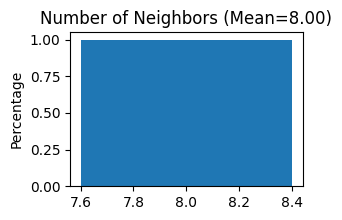

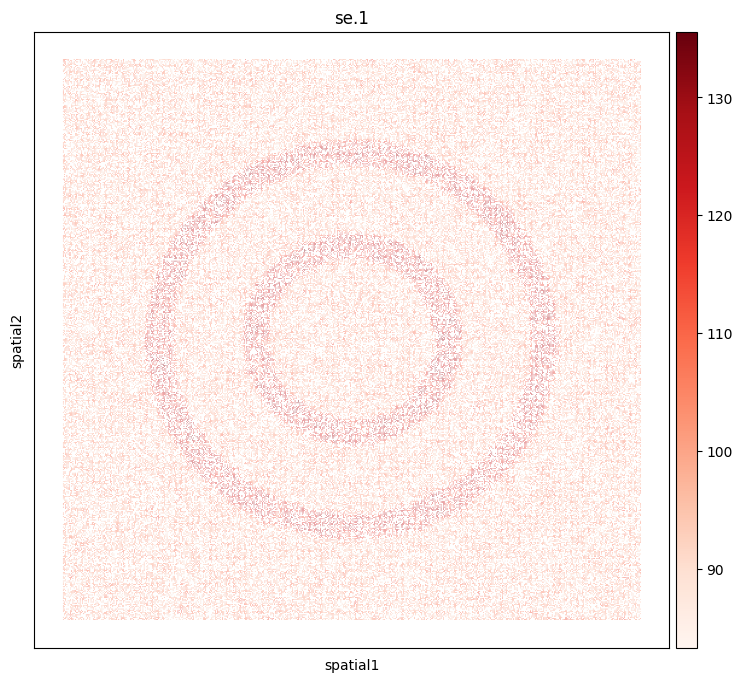

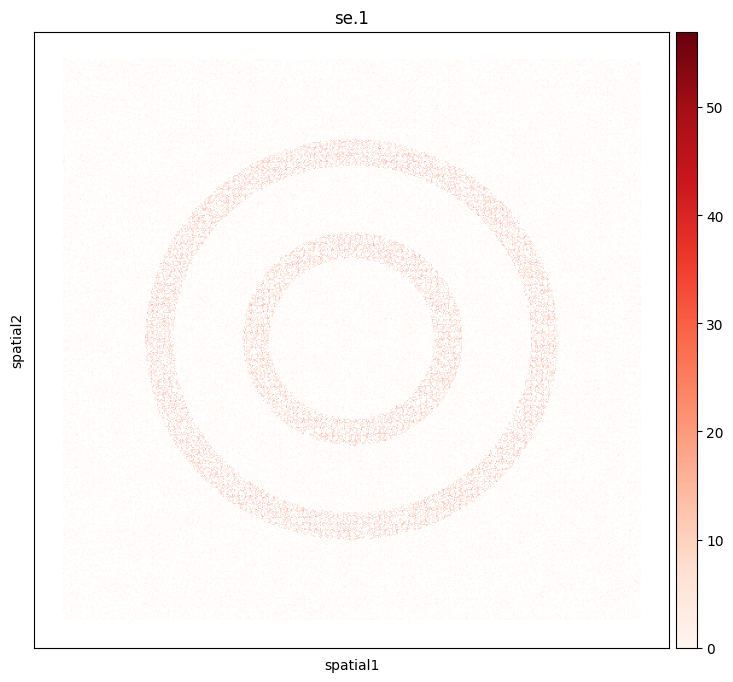

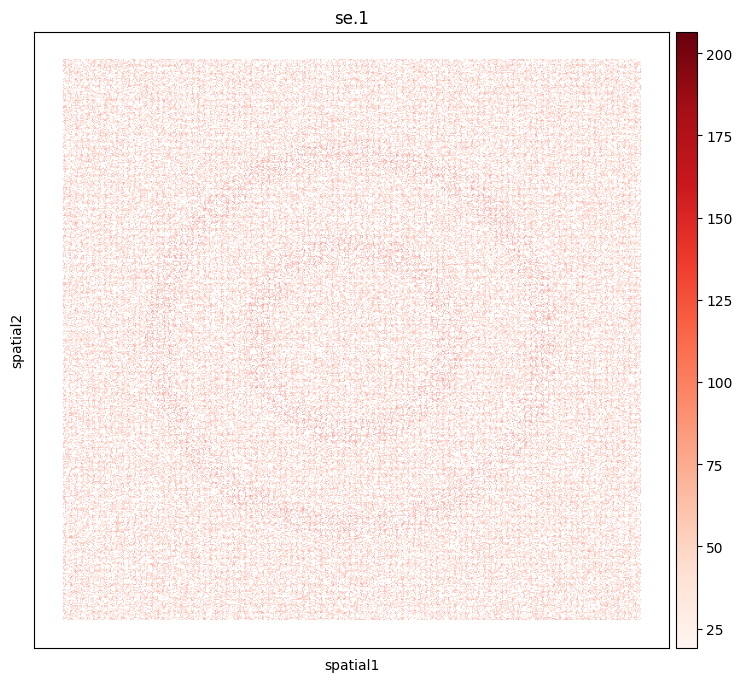

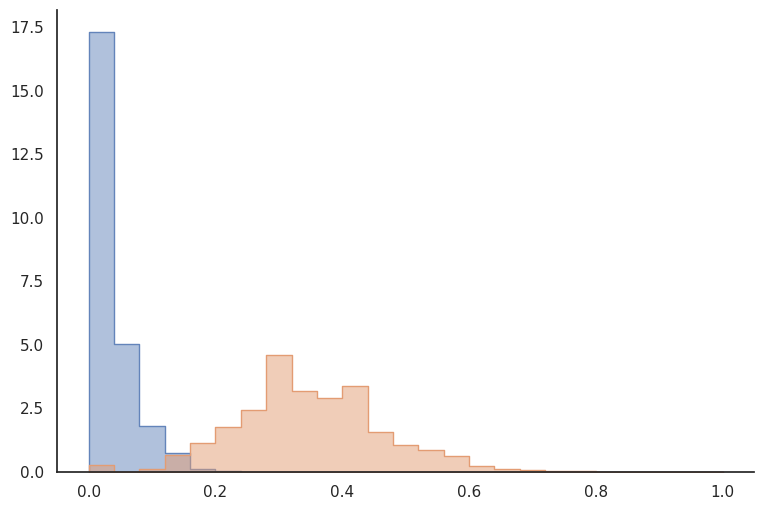

...

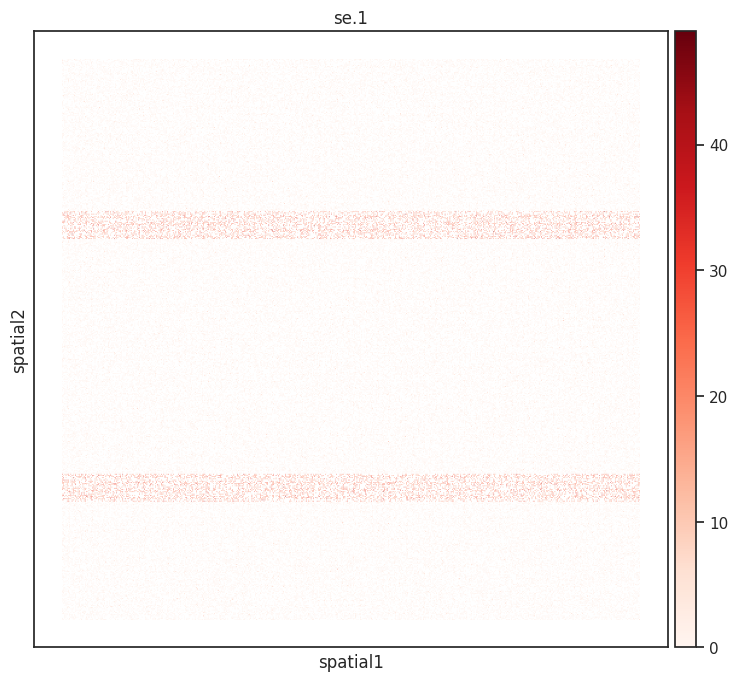

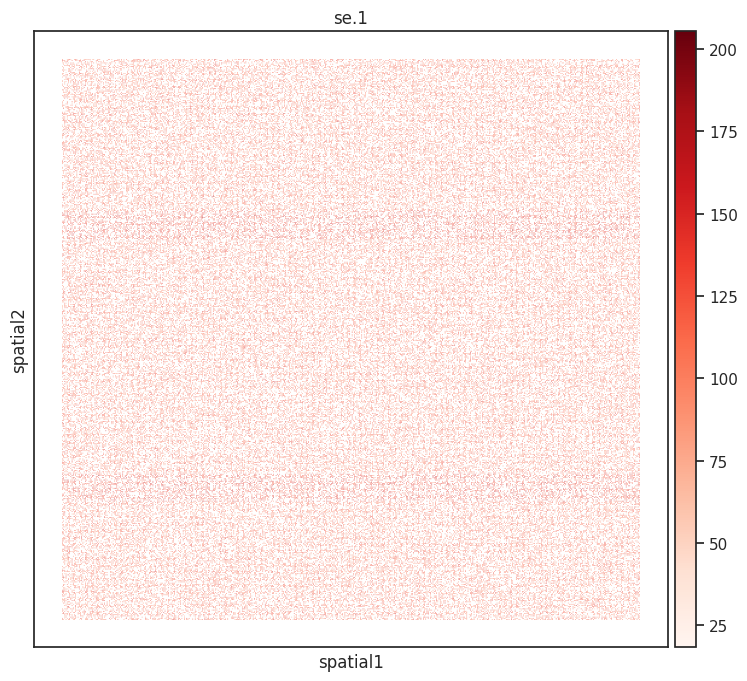

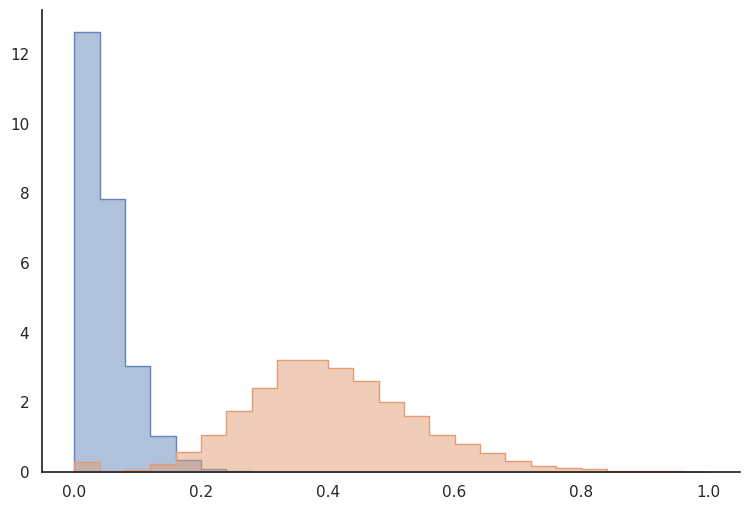

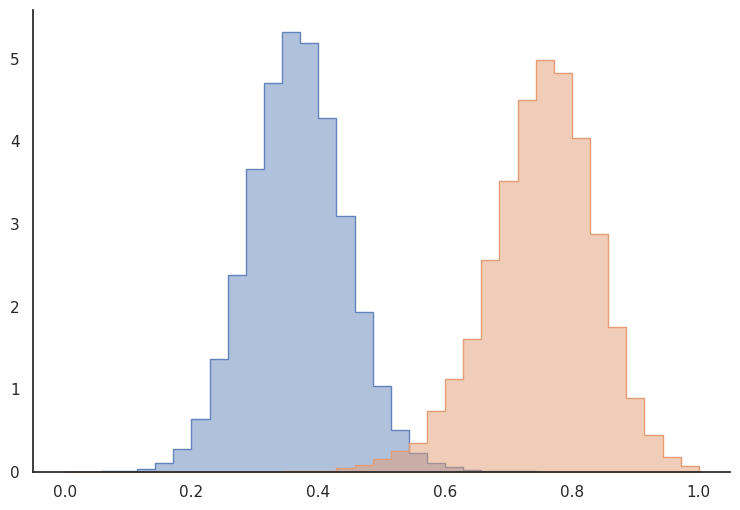

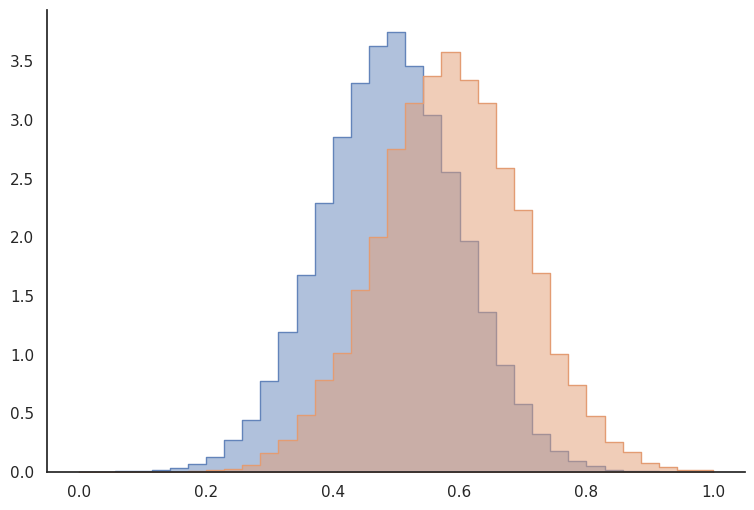

In [3]:
dist_mapping={'0':'ZIP','1':'ZINB'}
dist = dist_mapping['1']
patterns = [f for f in os.listdir('.') if f.endswith('.png')]
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
for ptn in patterns:
    res_dir = ptn.split('.')[0]
    print(f'================================== pattern:{res_dir}  ===================================')
    res_dir = f'{dist}/{res_dir}'
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    current_img_dir = '.' 
    if dist=='ZINB':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZINB',ptn=ptn,png_dir=current_img_dir, se_mu=20,se_size=20,ns_mu=2,ns_size=2,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
        mean = 20  # noise mean
        stddev = 20  # noise std
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
        
    elif dist=='ZIP':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZIP',ptn=ptn,png_dir=current_img_dir, se_mu=15,ns_mu=3,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
        mean = 15  
        stddev = 15 
        noise = np.random.normal(mean, stddev, adata.shape)
        adata.X = adata.layers['gt'] + noise
        adata.X = adata.X - adata.X.min()
    adata.layers['noise'] = adata.X.copy()

    #STAGATE model
    STAGATE_pyG.Cal_Spatial_Net(adata, k_cutoff=8,model='KNN')
    STAGATE_pyG.Stats_Spatial_Net(adata)
    adata = STAGATE_pyG.train_STAGATE(adata, device = device,save_reconstrction=True)
    
    #Evaluation
    adata.layers['rex'] = adata.layers['STAGATE_ReX']
    adata.layers['gt_norm'] = min_max_norm(adata.layers['gt'])
    adata.layers['rex_norm'] = min_max_norm(adata.layers['rex'])
    adata.layers['noise_norm'] = min_max_norm(adata.layers['noise'])
    gt_data = adata.layers['gt'][:, :50]
    rex_data = adata.layers['rex'][:, :50]
    noise_data = adata.layers['noise'][:, :50]
    
    gt_norm_data = adata.layers['gt_norm'][:, :50]
    rex_norm_data = adata.layers['rex_norm'][:, :50]
    noise_norm_data = adata.layers['noise_norm'][:, :50]
    
    # 2.  Reconstructed (Rex) vs Ground Truth
    rex_pcc, rex_spcc,pcc_per_gene, spcc_per_gene = compute_all_metrics(gt_data, rex_data)
    noise_pcc, noise_spcc,noise_pcc_per_gene,noise_spcc_per_gene = compute_all_metrics(gt_data, noise_data)
    rmse, mae, rmse_per_gene, mae_per_gene=error_metrics(gt_norm_data,rex_norm_data)
    noise_rmse, noise_mae, noise_rmse_per_gene, noise_mae_per_gene=error_metrics(gt_norm_data,noise_norm_data)
    
    print(f"\n{'Metric':<10} | {'Reconstructed (STAGATE)':<22} | {'Noisy Input':<22}")
    print("-" * 60)
    print(f"{'PCC':<10} | {rex_pcc:.4f}{' (Higher is better)':<22} | {noise_pcc:.4f}")
    print(f"{'SPCC':<10} | {rex_spcc:.4f}{' (Higher is better)':<22} | {noise_spcc:.4f}")
    print(f"{'RMSE':<10} | {rmse:.4f}{' (Lower is better)':<22} | {noise_rmse:.4f}")
    print(f"{'MAE':<10} | {mae:.4f}{' (Lower is better)':<22} | {noise_mae:.4f}")
    
    rex_df = pd.DataFrame({"Methods": ["STAGATE"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": pcc_per_gene,"SPCC": spcc_per_gene,"RMSE":rmse_per_gene,"MAE":mae_per_gene,"pattern":res_dir},)
    
    # Noise vs GT
    noise_df = pd.DataFrame({"Methods": ["Noise"] * len(pcc_per_gene),"Gene": adata.var_names[:50],"PCC": noise_pcc_per_gene,"SPCC": noise_spcc_per_gene,"RMSE":noise_rmse_per_gene,"MAE":noise_mae_per_gene,"pattern":res_dir})
    rex_df.to_csv(f"{res_dir}/STAGATE_rex_vs_gt_correlation.csv", index=False)
    noise_df.to_csv(f"{res_dir}/noise_vs_gt_correlation.csv", index=False)
    
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='rex',show=False)
    plt.savefig(f'{res_dir}/STAGATE_svg_sp_rex.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='gt',show=False)
    plt.savefig(f'{res_dir}/STAGATE_svg_sp_gt.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='noise',show=False)
    plt.savefig(f'{res_dir}/STAGATE_svg_sp_noise.png')

    plot_gene_dist(adata,0,num_bin=25,layer='gt_norm',save=f'{res_dir}/gt_svg_dist_gt.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='rex_norm',save=f'{res_dir}/STAGATE_svg_dist_rex.svg')
    plot_gene_dist(adata,0,num_bin=35,layer='noise_norm',save=f'{res_dir}/Noise_svg_dist_noise.svg')